In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

from run_tripods_analysis import *
from irvine_updates import *

import pandas as pd
import numpy as np


# plot stuff
from matplotlib import pyplot as plt
import seaborn as sns
#sns.set()
# my own stuff

plt.style.use('default')
from load_data import *
from coefficient_maps import *
#from metrics import *
#from multitask_gtv import *
from load_lens import *
from define_fusion import neighbors, edge_incidence
#from gtv import *

# weird stuff
import regreg.api as rr
# installation instructions: https://regreg.github.io/regreg/download.html

In [4]:
X, Xlens, fts, Xnzi, Xenso, Xtele = load_predictors('obs', 'monthly')
yavg, Y, regions = load_response(X.shape[0])
S_obs_month = X.T@X/X.shape[0]
S_obs_month_lens = Xlens.T@Xlens/Xlens.shape[0]

for alpha in [.9, .95, .975]:
    t = televaluation(Xnzi, Xenso, Xtele, yavg, 'avg', alpha, 50)
    print(alpha)
    print(t[['Method', 'R2']])

0.9
           Method        R2
0             NZI  0.234525
1        Nino 3.4  0.131446
2  Nino 3.4 & NZI  0.232953
0.95
           Method        R2
0             NZI  0.236894
1        Nino 3.4  0.134436
2  Nino 3.4 & NZI  0.251803
0.975
           Method        R2
0             NZI  0.237402
1        Nino 3.4  0.134171
2  Nino 3.4 & NZI  0.253499


/Users/abbystevens/python_envs/fused_lasso/lib/python3.6/site-packages/sklearn/linear_model/base.py:485: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  linalg.lstsq(X, y)


In [12]:
from scipy import sparse

def fused_lasso_regreg(X, y, D, lambda_tv, lambda_lasso, alpha = 1, obj_vals = False):
    if alpha < 1:
        n = X.shape[0]
        weights = np.array([alpha**(n-t) for t in np.arange(1, n+1)])
        X = X * weights.reshape(-1,1)
        y = y * weights
    loss = rr.squared_error(X, y)
    sparsity = rr.l1norm(X.shape[1], lagrange=lambda_lasso)
    D = sparse.csr_matrix(D)
    fused = rr.l1norm.linear(D, lagrange=lambda_tv)
    problem = rr.container(loss, sparsity, fused)
    solver = rr.FISTA(problem)
    if obj_vals:
        obj_vals = solver.fit(max_its=100, tol=1e-6)
        return problem, obj_vals
    else:
        obj_vals = solver.fit(max_its=100, tol=1e-6)
        return problem
    
def assess_predictions_together(X_train, y_train, X_test, y_test, betas, plot = True, title='Prediction', figsize=(10,3)):
    yhat_train = np.dot(X_train, betas)
    yhat_test = np.dot(X_test, betas)
    errors_train = compute_errors(y_train, yhat_train)
    errors_test = compute_errors(y_test, yhat_test)
    y = np.append(y_train, y_test)
    yhat = np.append(yhat_train, yhat_test)
    t = X_train.shape[0]
    if plot:
        plt.figure(figsize=figsize)
        plt.plot(y)
        plt.plot(yhat)
        plt.axvline(x=t, color='black', dashes=[2,2])
        plt.title(title)
        plt.xlabel('Year')
        plt.ylabel('Precipitation')
    return (errors_train, errors_test)

In [131]:
def weighted_lasso(X,y,alpha):
    #las = linear_model.LassoCV(cv=6)
    las = linear_model.Lasso(alpha=.025)
    n = X.shape[0]
    weights = np.array([alpha**(n-t) for t in np.arange(1, n+1)])
    X = X * weights.reshape(-1,1)
    y = y * weights
    las.fit(X,y)
    #print(las.alpha_)
    return las.coef_

((0.42199022243023654, 0.5426874106133833),
 (1.0712941095818573, 0.05231519557541231))

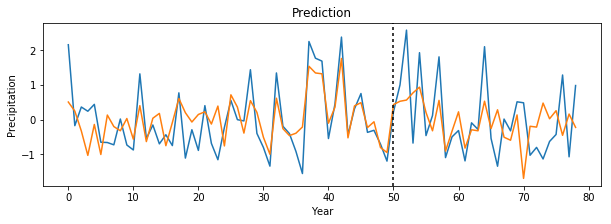

In [132]:
beta = weighted_lasso(X_train, y_train, .95)
assess_predictions_together(X_train, y_train, X_test, y_test, beta)

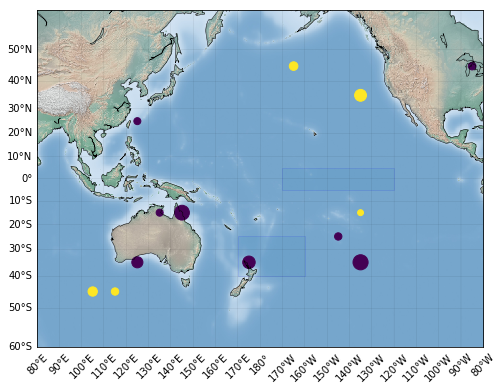

In [133]:
fts['coef'] = beta
plot_coefs(fts)

In [135]:
min(abs(beta[abs(beta)>1e-6]))

0.012918649117948548

In [13]:
Slens = Xlens.T@Xlens/Xlens.shape[0]
Dlens = edge_incidence(Slens, .85)
Dlens.shape

(2355, 900)

In [57]:
S = X.T@X/X.shape[0]
D = edge_incidence(S, .85)
D.shape

(1691, 900)

In [82]:
Dneigh = neighbors(fts)

In [14]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)

((0.5477618387963971, 0.4063881778479659),
 (0.842717102195036, 0.25451826437216585))

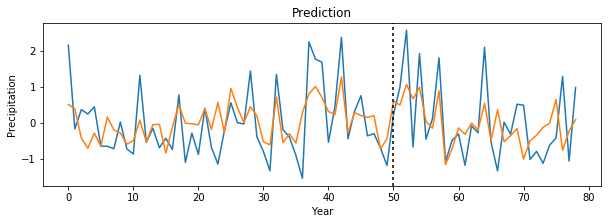

In [91]:
fused = fused_lasso_regreg(X_train, y_train, Dneigh, .5, .25, alpha=.95)
assess_predictions_together(X_train, y_train, X_test, y_test, fused.coefs)

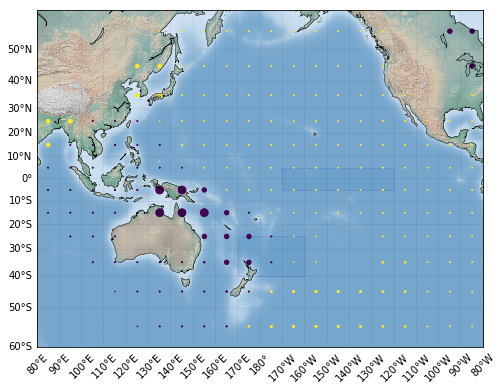

In [92]:
fts['coef'] = fused.coefs
plot_coefs(fts)

In [94]:
max(abs(fused.coefs[abs(fused.coefs)>1e-6]))

0.06082777857651524

((0.2605783058554494, 0.7176101875004135),
 (1.044096691432246, 0.07637448953533943))

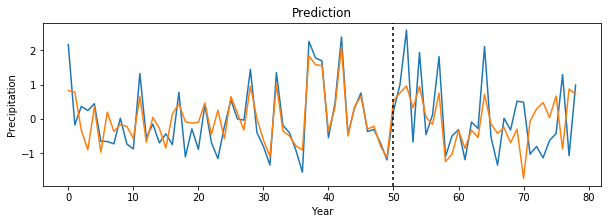

In [71]:
gtv_obs = fused_lasso_regreg(X_train, y_train, D, .01, .5, alpha=.95)
assess_predictions_together(X_train, y_train, X_test, y_test, gtv_obs.coefs)

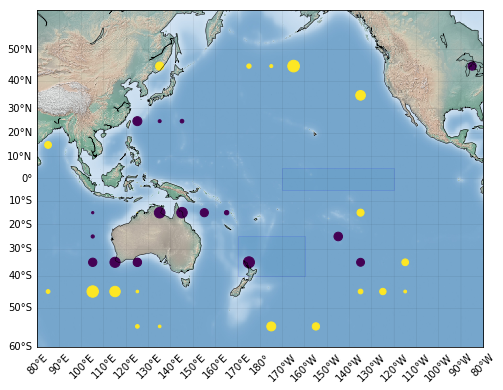

In [72]:
fts['coef'] = gtv_obs.coefs
plot_coefs(fts)

In [76]:
min(abs(gtv_obs.coefs[abs(gtv_obs.coefs)>1e-6]))

0.0003978697069770943

In [36]:
gtv = fused_lasso_regreg(X_train, y_train, Dlens, .7, .55, alpha=.95)

((0.30516770635635376, 0.669288465530572),
 (0.8060978302122053, 0.2869122888485679))

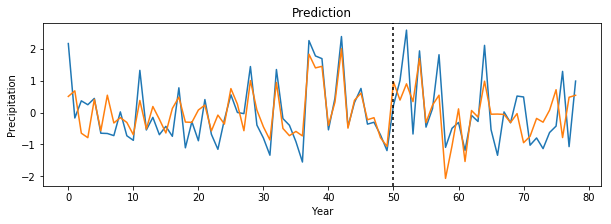

In [47]:
assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs)

In [53]:
y_hat = X@gtv.coefs
df = pd.DataFrame(np.arange(1940, 2019), columns=['year'])
df['prediction'] = y_hat

In [55]:
df.to_csv('monthly_observations_alpha95_predictions.csv', index=False)

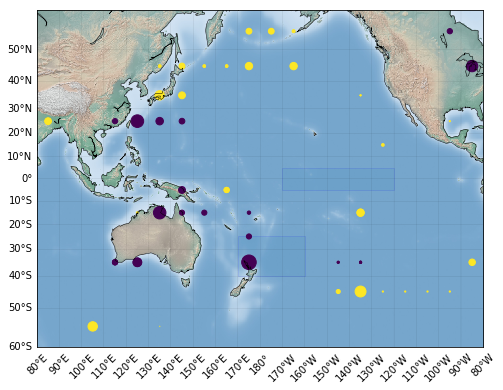

In [77]:
fts['coef'] = gtv.coefs
plot_coefs(fts)

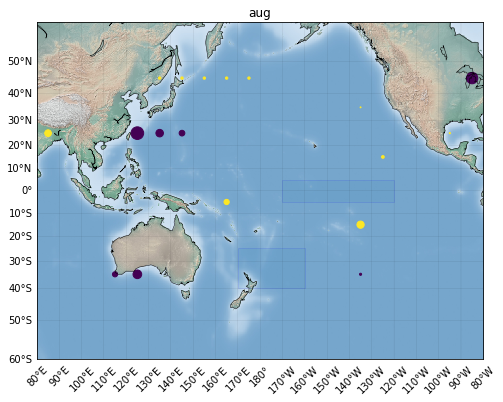

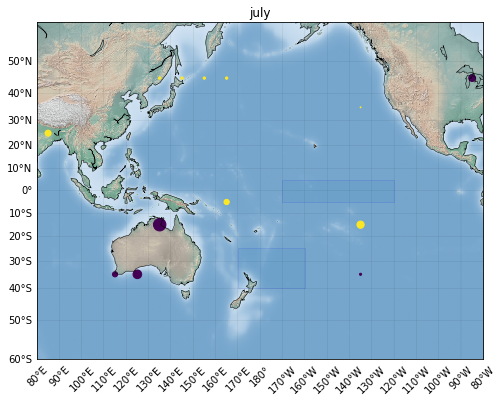

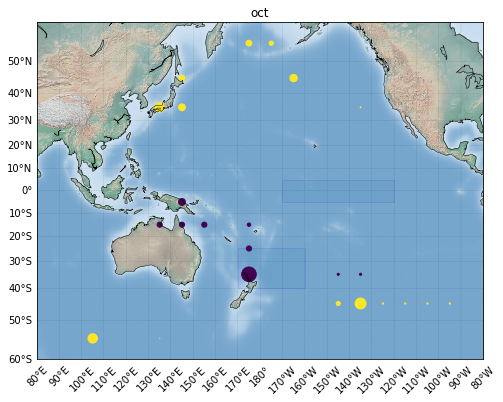

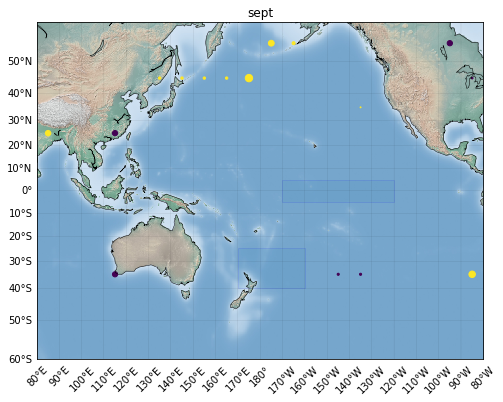

In [136]:
fts['coef'] = gtv.coefs
plot_coefs_by_time(fts)

In [79]:
max(abs(gtv.coefs[abs(gtv.coefs)>1e-6]))

0.21302838816968184

0.5
((0.2946319366740631, 0.6807061237095736), (0.8136754248347057, 0.2802090210777445))
0.525
((0.3002142199523753, 0.6746565797035712), (0.8094150778472443, 0.2839777957452063))
0.55
((0.30516770545007343, 0.6692884665127119), (0.8060978503003029, 0.28691227107829853))
0.575
((0.3100739636791413, 0.6639715337126745), (0.807412561214276, 0.2857492556708211))
0.6
((0.31293537302355806, 0.6608706123001964), (0.8107655127072557, 0.28278317833365574))


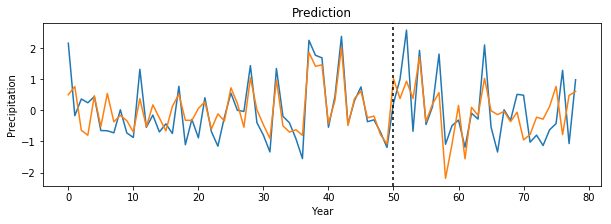

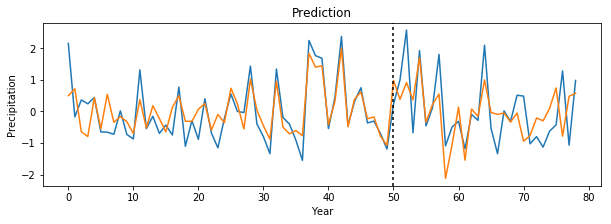

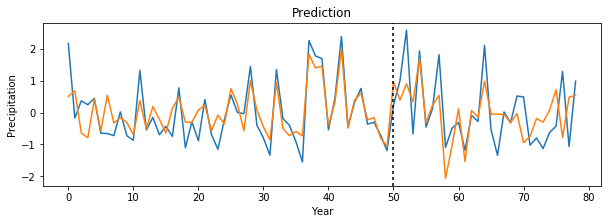

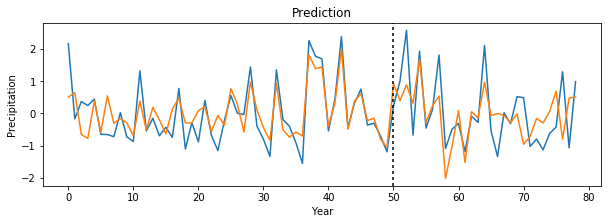

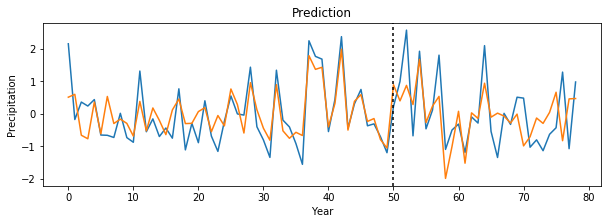

In [35]:
for j in np.linspace(.5, .6, 5):
    print(j)
    gtv = fused_lasso_regreg(X_train, y_train, Dlens, .7,j, alpha=.95)
    print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))

((0.2908873700385516, 0.6847641264148367),
 (0.8201528162901358, 0.27447901155027976))

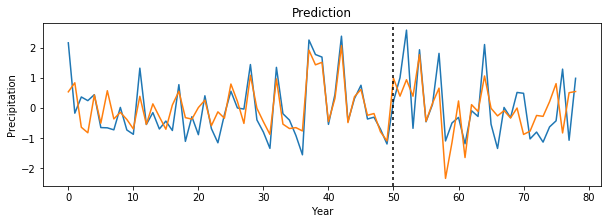

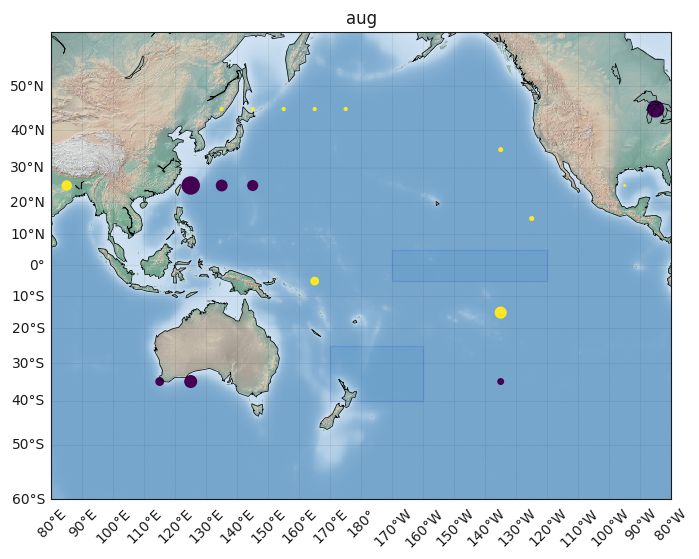

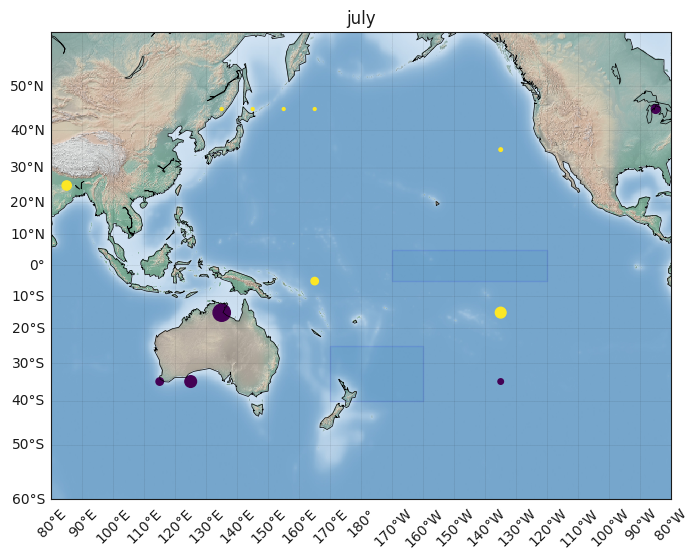

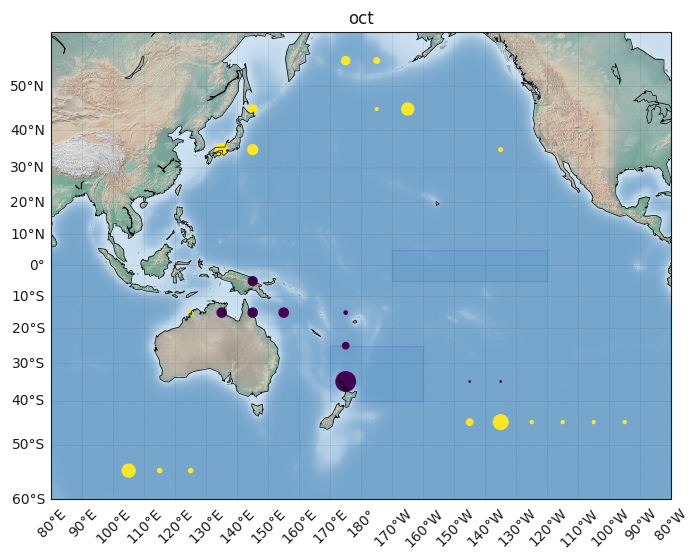

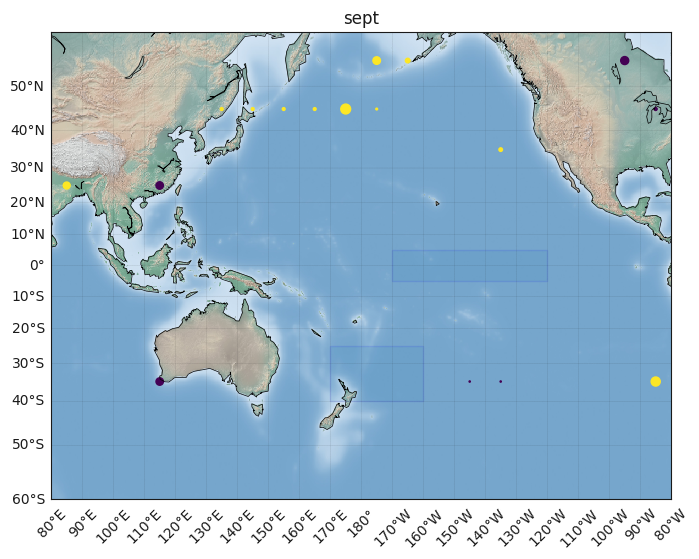

In [171]:
fts['coef'] = gtv.coefs
plot_coefs_by_time(fts)

((0.1871457806693411, 0.7971893257199225), (0.9302208990708933, 0.17711093254143928))


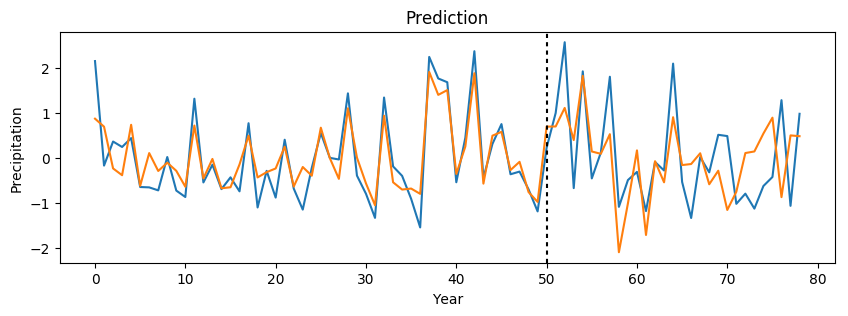

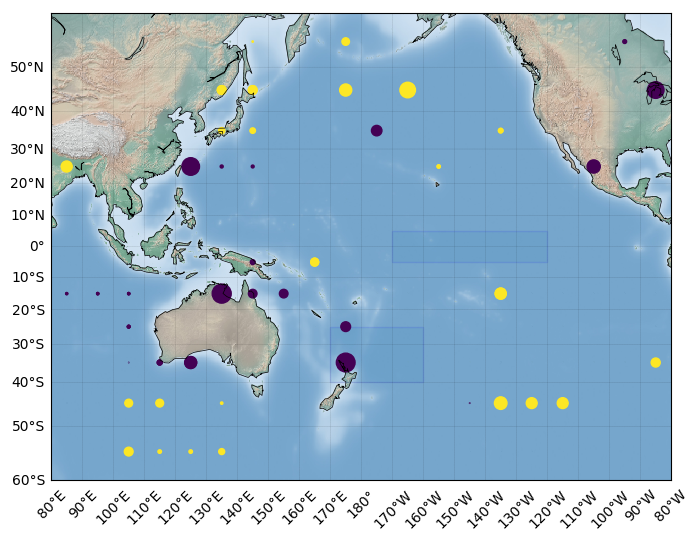

In [79]:
gtv = fused_lasso_regreg(X_train, y_train, Dlens, .5, 1, alpha=.975)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plot_coefs(fts)

In [80]:
X, Xlens, fts, Xnzi, Xenso, Xtele = load_predictors('obs', 'seasonal')
yavg, Y, regions = load_response(X.shape[0])
Slens = Xlens.T@Xlens/Xlens.shape[0]
Dlens = edge_incidence(Slens, .85)
Dlens.shape

(1144, 450)

((0.3597558246172457, 0.610131090822066), (1.1374843009792048, 0.015212903719620252))


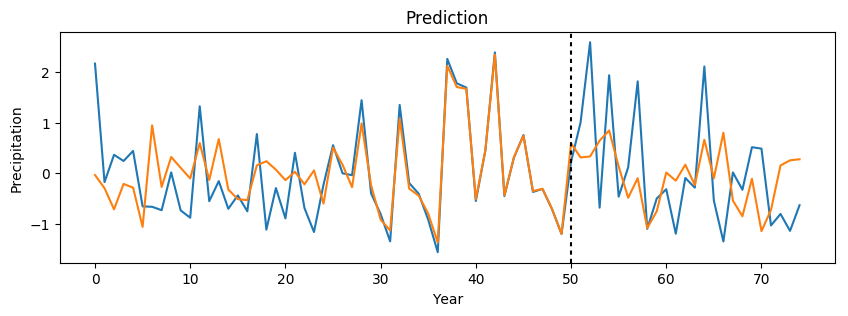

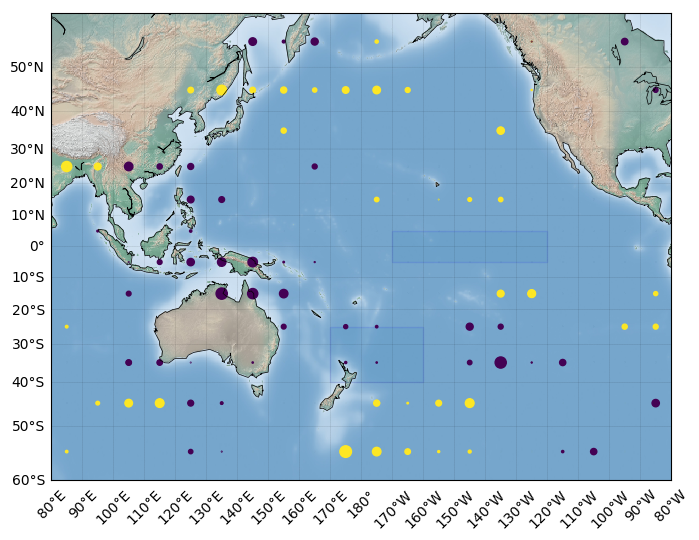

In [118]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
gtv = fused_lasso_regreg(X_train, y_train, Dlens, .001, .05, alpha=.9)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plot_coefs(fts)

((0.4194098240126803, 0.5454837992955333), (0.8435741600334796, 0.25376009657982856))


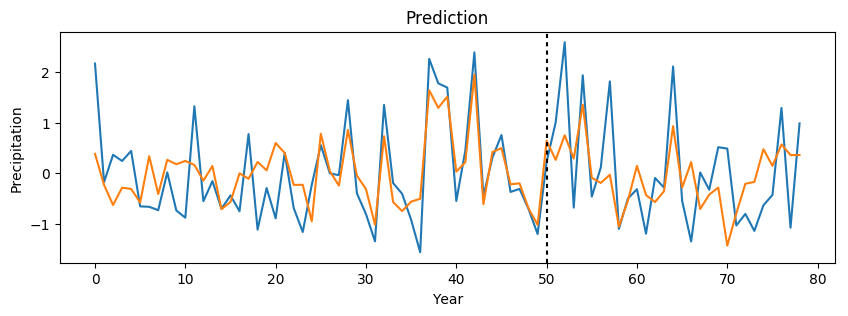

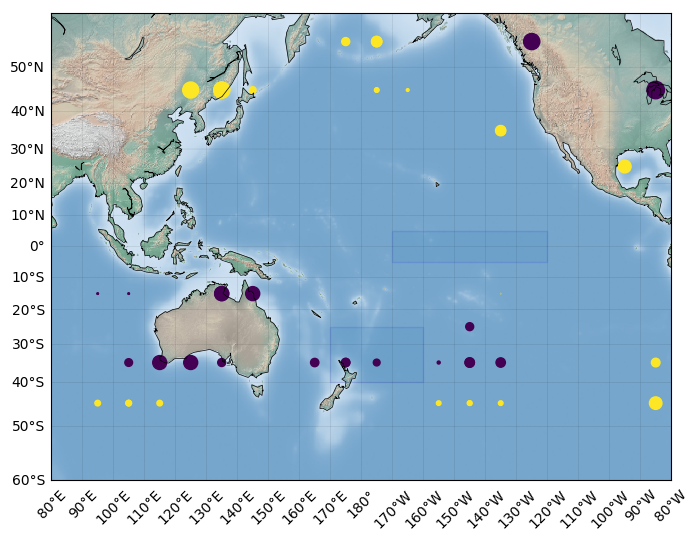

In [100]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
gtv = fused_lasso_regreg(X_train, y_train, Dlens, .1, .5, alpha=.95)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plot_coefs(fts)

((0.23781820258606956, 0.7422754077059542), (0.9630974384211616, 0.14802779236018992))


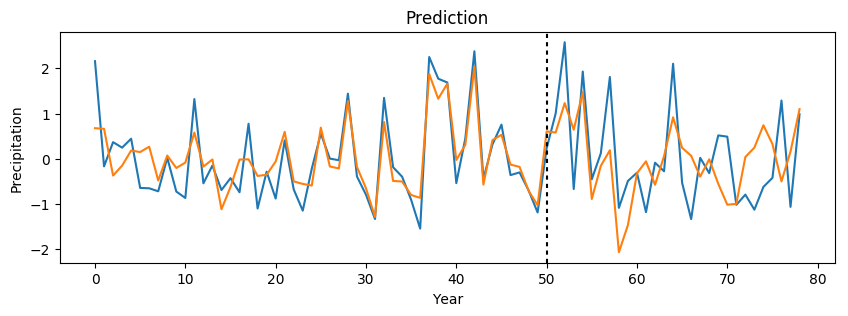

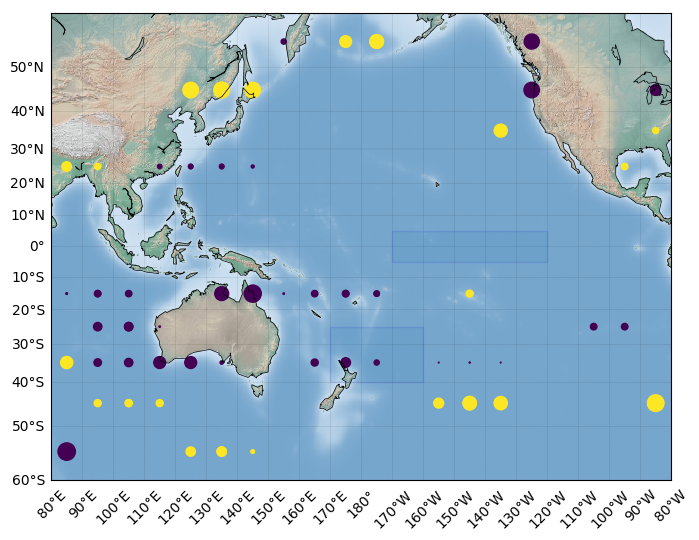

In [107]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
gtv = fused_lasso_regreg(X_train, y_train, Dlens, .1, .5, alpha=.975)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plot_coefs(fts)

In [119]:
X, Xlens, fts, Xnzi, Xenso, Xtele = load_predictors('reanalysis', 'monthly')
yavg, Y, regions = load_response(X.shape[0])
Slens = Xlens.T@Xlens/Xlens.shape[0]
Dlens = edge_incidence(Slens, .85)
Dlens.shape

(3825, 968)

((0.362310975534254, 0.607362062963076), (1.1161723574150049, 0.03366390739555003))


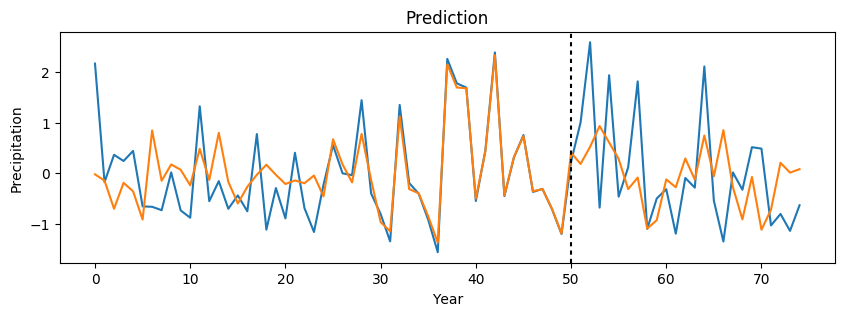

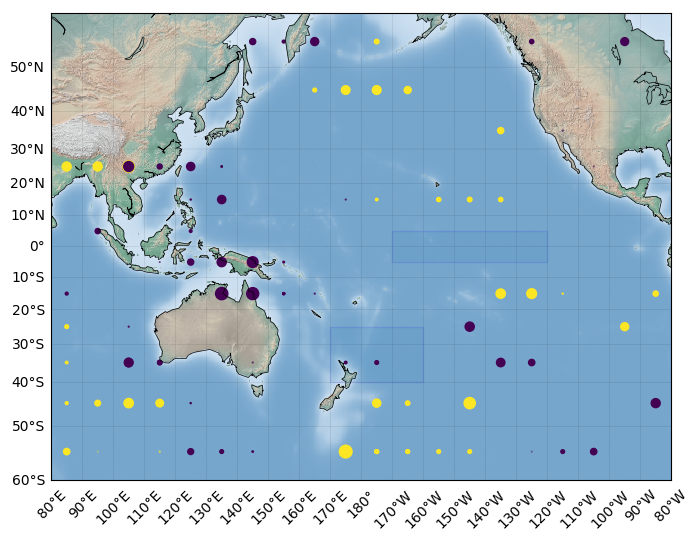

In [125]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
gtv = fused_lasso_regreg(X_train, y_train, Dlens, 1, .05, alpha=.9)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plot_coefs(fts)

((0.2162467171086189, 0.7656525177816258), (1.0050251319391026, 0.12989060111062734))


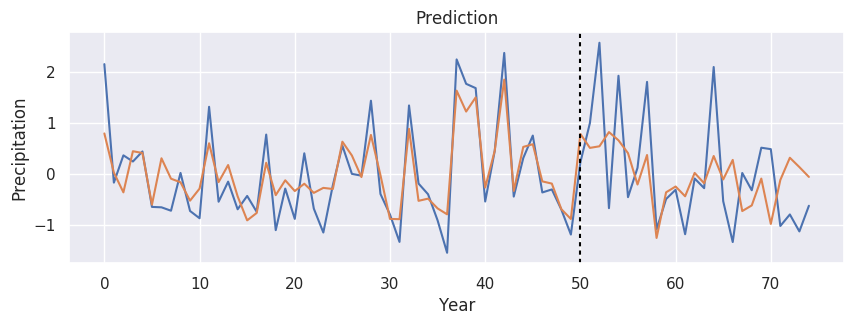

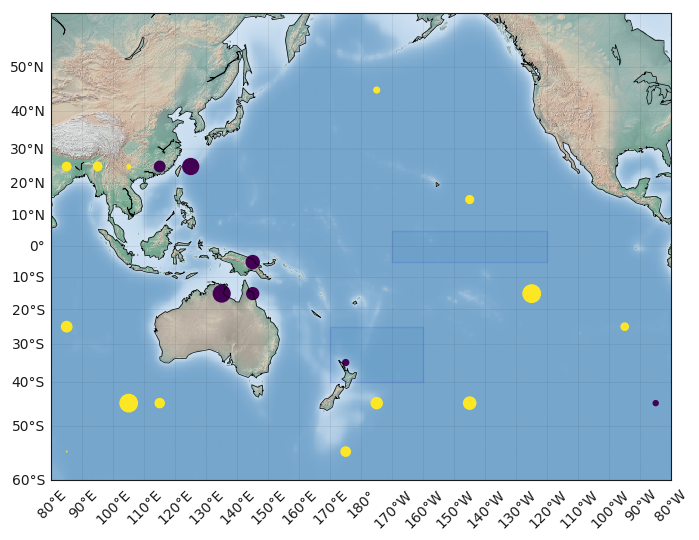

In [140]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
#gtv = fused_lasso_regreg(X_train, y_train, Dlens, 3, 2, alpha=.975)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plt.style.use('default')
plot_coefs(fts)

In [150]:
X, Xlens, fts, Xnzi, Xenso, Xtele = load_predictors('reanalysis', 'seasonal')
yavg, Y, regions = load_response(X.shape[0])
Slens = Xlens.T@Xlens/Xlens.shape[0]
Dlens = edge_incidence(Slens, .85)
Dlens.shape

(1327, 484)

((0.7616550294573144, 0.17459122219816947), (1.0160644364133495, 0.12033322560329929))


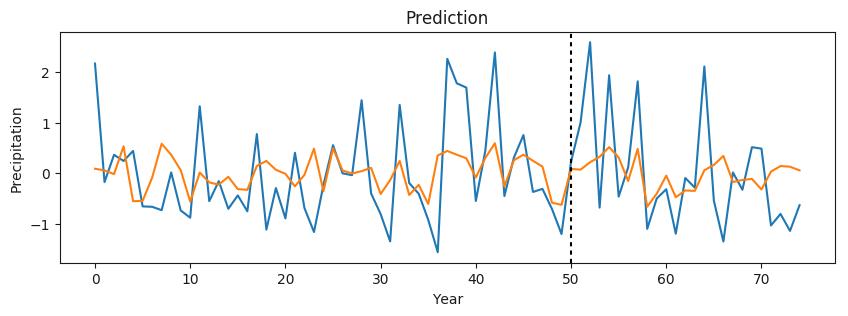

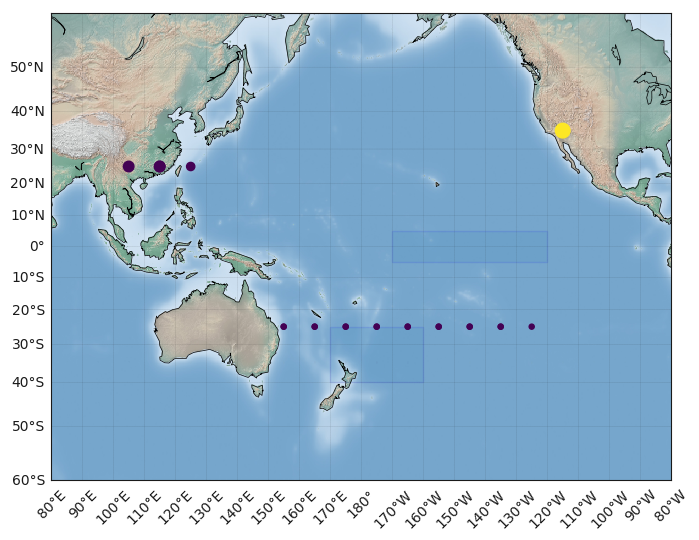

In [157]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
gtv = fused_lasso_regreg(X_train, y_train, Dlens, 2, 1, alpha=.9)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plt.style.use('default')
plot_coefs(fts)

((0.5959252548375136, 0.35419328011639806), (1.5566171958095765, -0.3476551078215231))


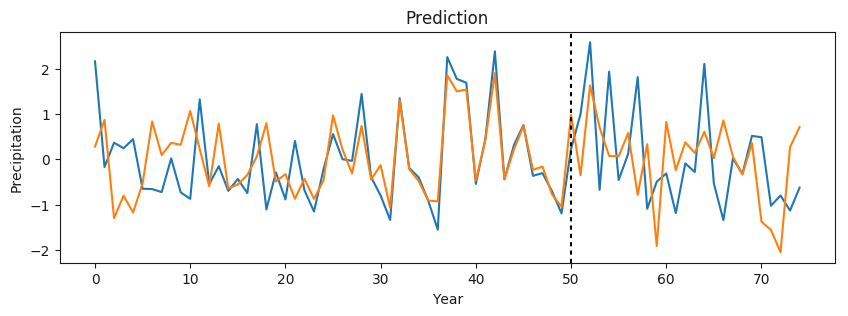

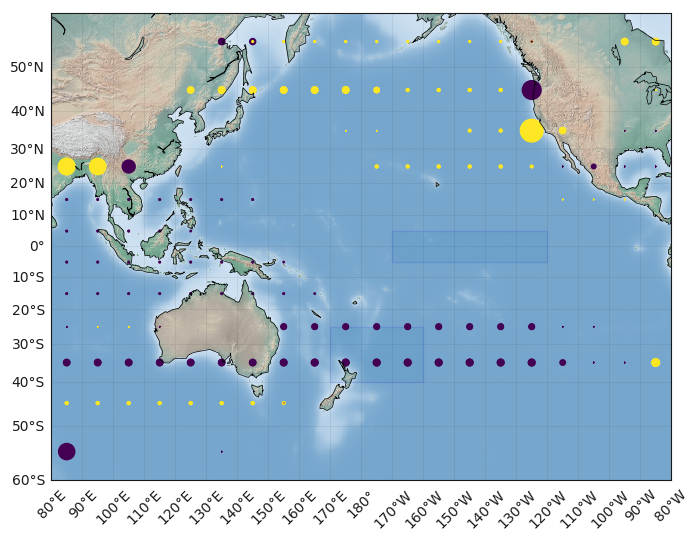

In [151]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
gtv = fused_lasso_regreg(X_train, y_train, Dlens, 2, .2, alpha=.95)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plt.style.use('default')
plot_coefs(fts)

In [159]:
X, Xlens, fts, Xnzi, Xenso, Xtele = load_predictors('obs', 'monthly')
yavg, Y, regions = load_response(X.shape[0])
S = X.T@X/X.shape[0]
Slens = Xlens.T@Xlens/Xlens.shape[0]

D = edge_incidence(S, .85)
Dlens = edge_incidence(Slens, .85)

In [162]:
las = linear_model.LassoCV()
las.fit(X[:50], yavg[:50])
las.alpha_

/Users/abbystevens/python_envs/fused_lasso/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1943: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


0.17571960384381308

((0.17940739436962186, 0.8055754476921763), (1.2407438082527824, -0.0975828605311777))


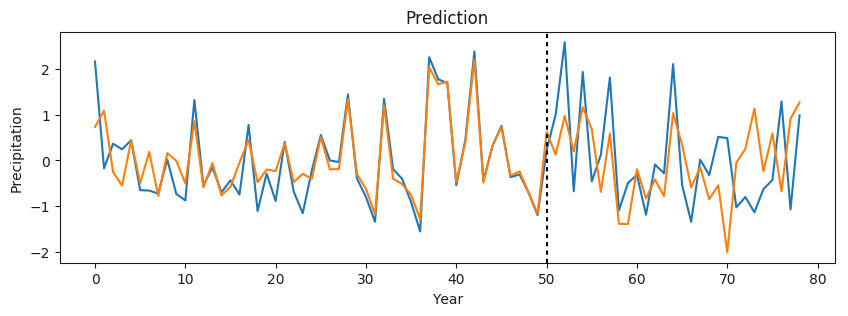

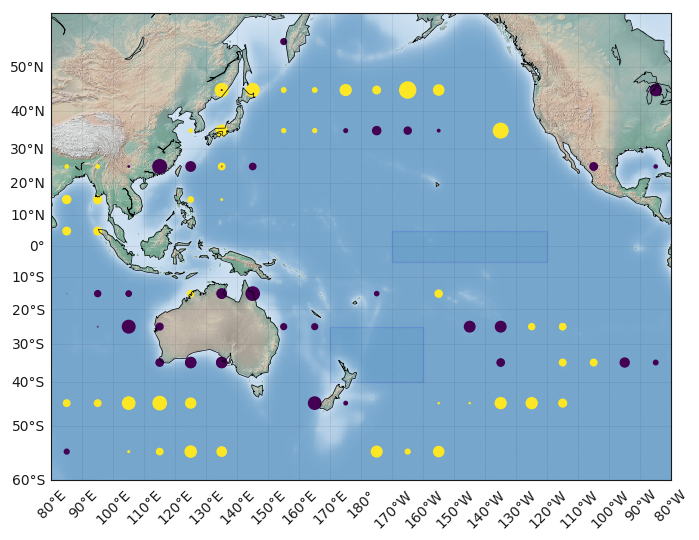

In [163]:
X_train, X_test, y_train, y_test = temporal_split(X, yavg, 50)
gtv = fused_lasso_regreg(X_train, y_train, D, 1, .175, alpha=.95)
print(assess_predictions_together(X_train, y_train, X_test, y_test, gtv.coefs))
fts['coef'] = gtv.coefs
plt.style.use('default')
plot_coefs(fts)

In [228]:
tele_df = pd.DataFrame()
gtvs = []
for month in ['july', 'aug', 'sept', 'oct']:
    X, Xlens, fts, Xnzi, Xenso, Xtele = load_predictors('obs', 'one_month', month=month)
    yavg, Y, regions = load_response(X.shape[0])
    
    S = X.T@X/X.shape[0]
    Slens = Xlens.T@Xlens/Xlens.shape[0]

    D = edge_incidence(S, .5)
    Dlens = edge_incidence(Slens, .5)
    
    t = televaluation(Xnzi, Xenso, Xtele, yavg, 'avg', .9, 50)
    t['month'] = month
    tele_df = tele_df.append(t, ignore_index=True)
    
    gtv1 = fused_lasso_regreg(X[:50], yavg[:50], Dlens, .1, 1, alpha=.9)
    gtv2 = fused_lasso_regreg(X[:50], yavg[:50], Dlens, 1, .1, alpha=.9)
    print(month)
    print(compute_errors(yavg[50:], X[50:]@gtv1.coefs))
    print(compute_errors(yavg[50:], X[50:]@gtv2.coefs))
    gtvs.append(gtv)

july
(1.17016873659, -0.0351509640166896)
(0.8001534778892831, 0.2921707629857758)


/Users/abbystevens/python_envs/fused_lasso/lib/python3.6/site-packages/regreg-0.1.0+21.gb8205ee-py3.6-macosx-10.11-x86_64.egg/regreg/algorithms.py:192: UserWarning: prox is taking bad steps
  warnings.warn('prox is taking bad steps')


aug
(1.0867156413426635, 0.038673048960444545)
(1.0483661820728642, 0.07259762623836286)
sept
(1.3193785867937042, -0.16714450943412085)
(0.901668915751207, 0.2023684976547323)
oct
(0.7987367806508441, 0.2934239972128013)
(1.4034751468257705, -0.24153774219246804)


In [215]:
Dlens = edge_incidence(Slens, .5)
Dlens.shape

(2487, 225)

In [223]:
gtv = fused_lasso_regreg(X[:50], yavg[:50], Dlens, .1, 1, alpha=.95)
print(month)
print(compute_errors(yavg[50:], X[50:]@gtv.coefs))

oct
(0.860731952654274, 0.23858202437840303)


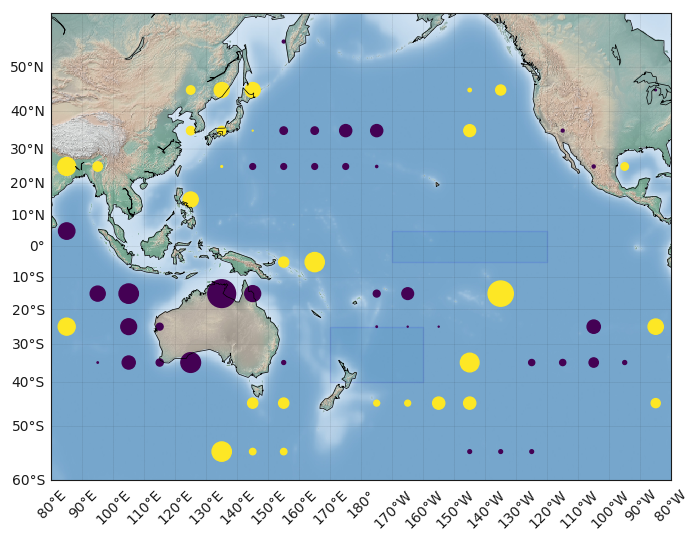

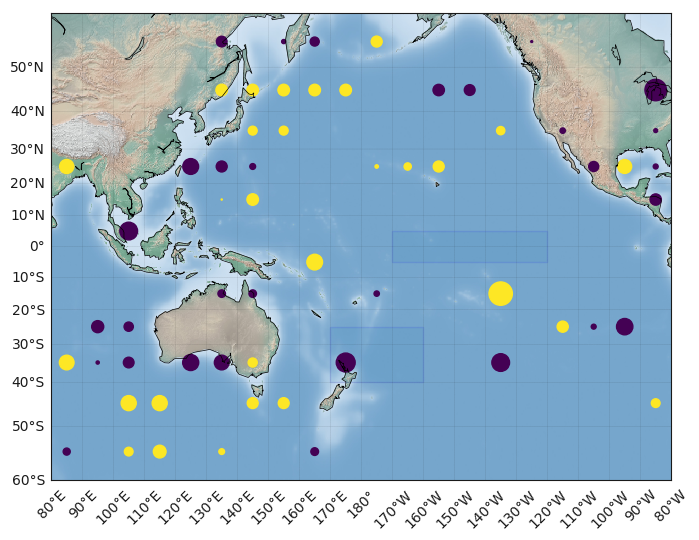

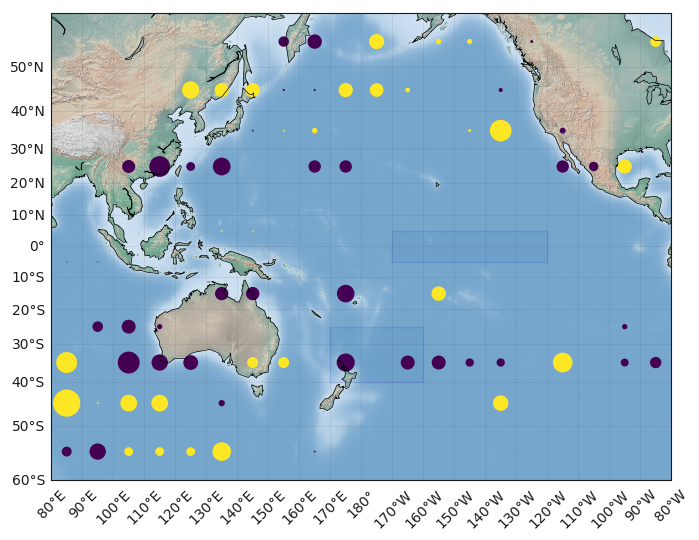

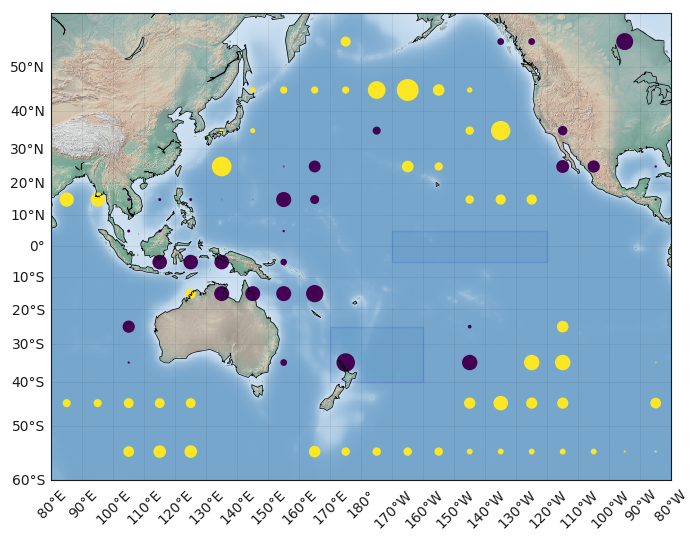

In [207]:
for g in gtvs:
    fts['coef'] = g.coefs
    plot_coefs(fts)

In [186]:
for g in gtvs:
    print(compute_errors(yavg[50:], X[50:]@g.coefs))

(1.2292866510929554, -0.08744766642793511)
(1.2514738099302014, -0.10707480065311947)
(0.9961105745009324, 0.11882381641243511)
(1.5478744898216386, -0.36927583194962255)


In [195]:
from sklearn.model_selection import KFold
def regreg_cv(X, y, Ds,
            lambda_gtv=np.linspace(.1, 1, 3),
            lambda_lasso=np.linspace(.1, 1, 3),
            t=50, cv=True, k=5, alpha=.9, lasso=True):
    errors = []
    X_train, X_test, y_train, y_test = temporal_split(X, y, t)
    n,p = X_train.shape
    for l1 in lambda_gtv:
        for l3 in lambda_lasso:
            # CV
            if cv:
                kf = KFold(n_splits=k, shuffle=True)
                for train, test in kf.split(X_train, y_train):
                    for m in Ds:
                        D = Ds[m]
                        problem = fused_lasso_regreg(X_train[train], y_train[train], D, l1, l3, alpha=.9)
                        beta = problem.coefs
                        mse, r2 = compute_errors(y_train[test], X_train[test]@beta)
                        errors.append(['train', m, l1, l3, mse, r2])

            # holdout errors (fit to all training data)
            for m in Ds:
                D = Ds[m]
                problem = fused_lasso_regreg(X_train, y_train, D, l1, l3, alpha=.9)
                beta = problem.coefs
                mse, r2 = compute_errors(y_test, X_test@beta)
                errors.append(['test', m, l1, l3, mse, r2])
    df = pd.DataFrame(errors, columns=['split', 'method', 'lambda_tv', 'lambda_1', 'mse', 'r2'])
    return df.groupby(['split', 'method', 'lambda_tv', 'lambda_1']).mean().reset_index()

In [196]:
X, Xlens, fts, Xnzi, Xenso, Xtele = load_predictors('obs', 'monthly')
yavg, Y, regions = load_response(X.shape[0])
S = X.T@X/X.shape[0]
Slens = Xlens.T@Xlens/Xlens.shape[0]

D = edge_incidence(S, .85)
Dlens = edge_incidence(Slens, .85)

In [197]:
df = regreg_cv(X, yavg, {'lens':Dlens}, k=3)

In [199]:
df.sort_values('mse')

,split,method,lambda_tv,lambda_1,mse,r2
6,test,lens,1.00,0.10,0.697077,0.383354
3,test,lens,0.55,0.10,0.719750,0.363297
16,train,lens,1.00,0.55,0.814912,0.103829
14,train,lens,0.55,1.00,0.891449,0.007800
0,test,lens,0.10,0.10,0.944737,0.164270
7,test,lens,1.00,0.55,0.949964,0.159646
10,train,lens,0.10,0.55,0.980696,-0.228148
17,train,lens,1.00,1.00,1.035284,-0.647477
4,test,lens,0.55,0.55,1.066484,0.056570
8,test,lens,1.00,1.00,1.111319,0.016909


In [200]:
gtv = fused_lasso_regreg(X[:50], yavg[:50], Dlens, 1, .1, alpha=.9)

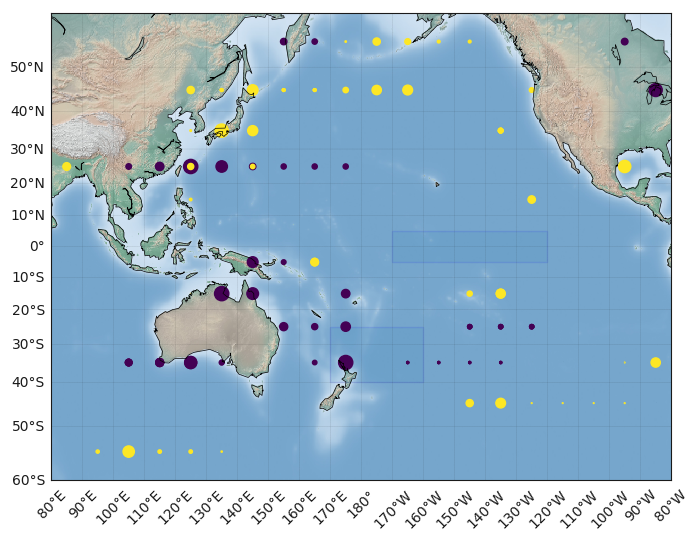

In [202]:
fts['coef'] = gtv.coefs
plot_coefs(fts)

In [249]:
las = linear_model.Lasso(alpha=.1)
n,p = X.shape
y = yavg

In [ ]:
def soft_threshold():
    

In [254]:
beta_t = np.zeros(p)
betas = np.array(beta_t)
for t in range(n):
    r = y[t] - X[t]@beta_t
    for j in range(p):
        beta_t[j] = 

(array([ 6., 12., 21., 12.,  9.,  4.,  4.,  3.,  5.,  3.]),
 array([-1.55052657, -1.13750683, -0.72448709, -0.31146735,  0.10155239,
         0.51457214,  0.92759188,  1.34061162,  1.75363136,  2.1666511 ,
         2.57967084]),
 <a list of 10 Patch objects>)

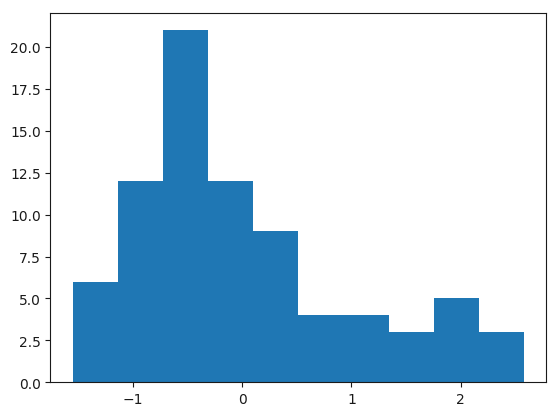

In [256]:
plt.hist(resids)